## I will be using FaceNet pre-trained model, InceptionResnetV1 to train on a combination of Labelled Faces in the Wild (LFW) dataset and Asian Faces Dataset.
### InceptionResnetV1 has been pretrained on VGGFace2 and CASIA-Webface, and using the pre-trained model that has been trained on facial images allows me to capitilize on transfer learning, as the model has already been trained on a diverse dataset, resulting in a better performance

## Import all required libraries

In [1]:
!pip install facenet-pytorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 13.7 MB/s eta 0:00:00


In [46]:
import os
import cv2
from torch.utils.data import Dataset, random_split
from facenet_pytorch import InceptionResnetV1
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
from sklearn.model_selection import train_test_split
from torch.optim import lr_scheduler
from torch import nn, optim
from torch.autograd import Variable
from sklearn.metrics import accuracy_score
from torch import nn, optim
from copy import deepcopy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torchvision
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Set up functions to prepare my dataset that I will be using, in this case LFW and AFD
## I filtered the image prior to loading the dataset in, and what I did was I took classes with more than 20 images and randomly selected 20 images from each class and split it into Training, Validation, and Testing sets where 70 percent goes to Training, 20 percent to Validation and 10 percent to Testing.

In [3]:
## Set up functions to prepare my dataset that I will be using, in this case LFW and AFD
## I filtered the image prior to loading the dataset in, and what I did was I took classes with more than 20 images and randomly selected 20 images from each class and split it into Training, Validation, and Testing sets where 70 percent goes to Training, 20 percent to Validation and 10 percent to Testing.def create_lfw_dataset(root_dir):
    samples = []
    labels = []

    for person in os.listdir(root_dir):
        person_dir = os.path.join(root_dir, person)
        person_images = os.listdir(person_dir)
        for img_file in person_images:
            samples.append(os.path.join(person_dir, img_file))
            labels.append(person)

    # Encode labels to integers
    label_to_int = {label: idx for idx, label in enumerate(set(labels))}
    labels = [label_to_int[label] for label in labels]

    return samples, labels, label_to_int


class LFWDataset(Dataset):
    def __init__(self, samples, labels, transform=None):
        self.samples = samples
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path = self.samples[idx]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        if self.transform:
            img = self.transform(img)

        label = self.labels[idx]

        return img, label


## Define the transformations to apply on each image before using it on my model

In [4]:
# Define the transformations on the dataset
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

## Load in my combined dataset using the function I have defined

In [5]:
train_samples, train_labels, label_to_int = create_lfw_dataset('/content/drive/MyDrive/Data/Training')
valid_samples, valid_labels, _ = create_lfw_dataset('/content/drive/MyDrive/Data/Validation')
test_samples, test_labels, _ = create_lfw_dataset('/content/drive/MyDrive/Data/Testing')

## Show the distribution of classes that I have retained for training

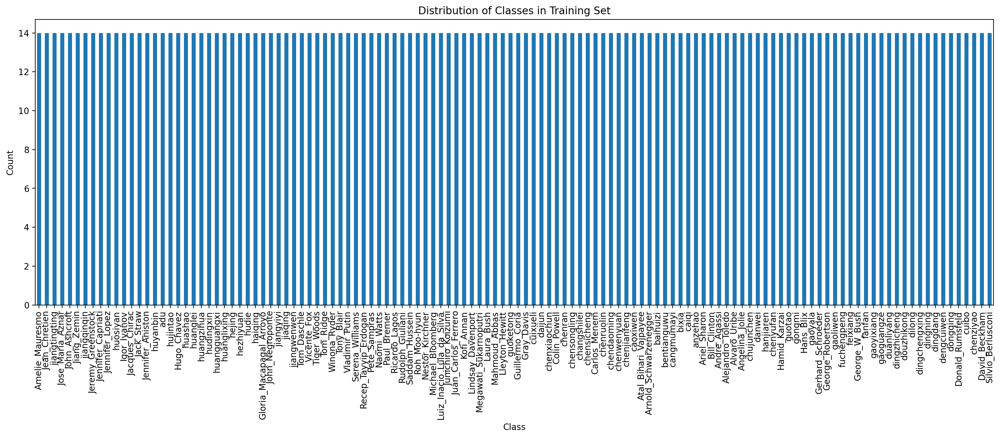

In [6]:
# Convert the integer labels back to original class names
int_to_label = {v: k for k, v in label_to_int.items()}
class_names_train = [int_to_label[label] for label in train_labels]  # Change labels to train_labels

# Create a DataFrame from the labels
df_train = pd.DataFrame(class_names_train, columns=['Class'])  # Change to class_names_train

# Count the number of instances per class
class_counts_train = df_train['Class'].value_counts()  # Change to df_train

# Plot the distribution
plt.figure(figsize=(20,6),dpi=200)
class_counts_train.plot(kind='bar')  # Change to class_counts_train
plt.title('Distribution of Classes in Training Set')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()


## Plot some examples from the dataset and display them

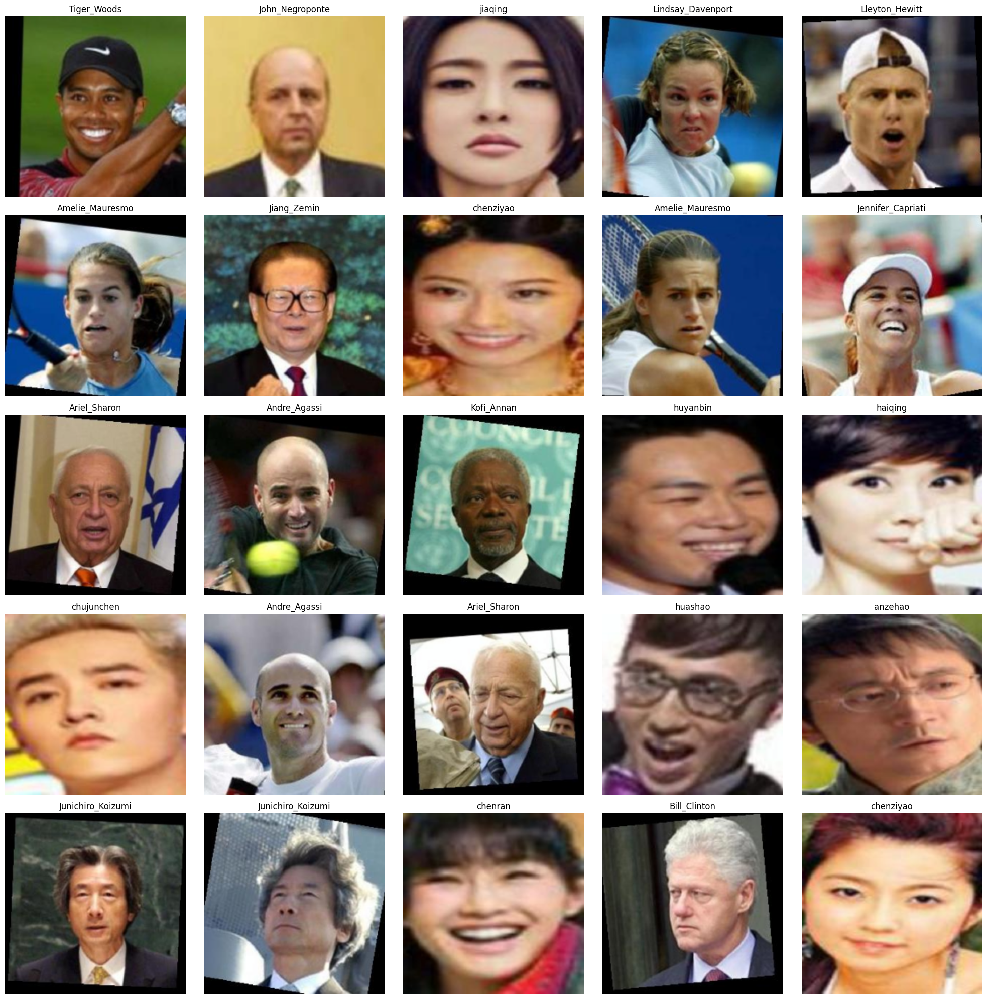

In [7]:
# Create dataset using training samples and labels
train_dataset = LFWDataset(train_samples, train_labels, transform=transform)

# Create data loader
batch_size = 25  # Reduce the batch size to a perfect square for better visualization
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Get a batch of training data
inputs, classes = next(iter(train_data_loader))

# Get class names
int_to_label = {v: k for k, v in label_to_int.items()}

# Prepare class names for the images
class_names = [int_to_label[c.item()] for c in classes]

# Create a grid of subplots
fig, axs = plt.subplots(int(np.sqrt(batch_size)), int(np.sqrt(batch_size)), figsize=(20, 20))
axs = axs.ravel()

# Denormalize function
def denormalize(tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    tensor = std * tensor + mean
    tensor = np.clip(tensor, 0, 1)
    return tensor

# Loop over the images and display
for i in range(batch_size):
    axs[i].imshow(denormalize(inputs[i].numpy().transpose((1, 2, 0))))
    axs[i].set_title(class_names[i])
    axs[i].axis('off')

plt.tight_layout()
plt.show()


## Create dataset and dataloader for training and validation

In [8]:
# Now create two separate datasets and dataloaders
train_dataset = LFWDataset(train_samples, train_labels, transform=transform)
valid_dataset = LFWDataset(valid_samples, valid_labels, transform=transform)
test_dataset = LFWDataset(test_samples, test_labels, transform=transform)

train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
valid_dataloader = DataLoader(valid_dataset, batch_size=32, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=32, shuffle=False)

## Show the number of classes used in training and evaluation

In [9]:
num_classes = len(class_counts_train)
print(f"Number of unique classes: {num_classes}")

Number of unique classes: 124


## Define the pre-trained InceptionResnetV1 model

In [11]:
# Define the model with the updated number of classes
model = InceptionResnetV1(pretrained='vggface2', classify=True, num_classes=num_classes)

  0%|          | 0.00/107M [00:00<?, ?B/s]

## Show the summary of the model

In [12]:
# Print the model architecture and the number of classes
print(model)

InceptionResnetV1(
  (conv2d_1a): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv2d_2a): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv2d_2b): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (maxpool_3a): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2d_3b): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv2d_4a): 

## Set up components required for training

In [13]:
# Define loss function, optimizer, and device
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters())
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [14]:
# Move the model to the device
model = model.to(device)

## Define 2 functions, train_model is used for training the model and validate_model is used for evaluating the model's performance

In [15]:
def train_model(model, dataloader, criterion, optimizer):
    model.train()
    running_loss = 0.0
    running_corrects = 0

    for inputs, labels in dataloader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        # Statistics
        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

    epoch_loss = running_loss / len(dataloader.dataset)
    epoch_acc = (running_corrects.double() / len(dataloader.dataset)).item()

    return epoch_loss, epoch_acc

In [16]:
def validate_model(model, dataloader, criterion):
    model.eval()
    running_loss = 0.0
    running_corrects = 0

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            # Statistics
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(dataloader.dataset)
        epoch_acc = (running_corrects.double() / len(dataloader.dataset)).item()

    return epoch_loss, epoch_acc

## Training is split into 2 phases, for the purpose of transfer learning. The first phase is where the model parameters are frozen to allow the pre-trained model to extract general features from my dataset and learn specific features from the dataset

In [17]:
# Initially, freeze all model parameters
for param in model.parameters():
    param.requires_grad = False

# Unfreeze the last layer group
for param in model.logits.parameters():
    param.requires_grad = True

## Training the model for the first phase

In [18]:
# Training loop with early stopping
num_epochs = 25
patience = 5  # Patience for early stopping
best_loss = None
best_model = None
best_epoch = None
stop_count = 0

In [19]:
# Lists to keep track of progress
train_loss_history = []
train_acc_history = []
val_loss_history = []
val_acc_history = []

# Training loop
for epoch in range(num_epochs):
    print('Epoch {}/{}'.format(epoch, num_epochs - 1))
    print('-' * 10)

    train_loss, train_acc = train_model(model, train_dataloader, criterion, optimizer)
    print('Train Loss: {:.4f} Acc: {:.4f}'.format(train_loss, train_acc))

    val_loss, val_acc = validate_model(model, valid_dataloader, criterion)
    print('Val Loss: {:.4f} Acc: {:.4f}'.format(val_loss, val_acc))

    # Record the loss and accuracy values
    train_loss_history.append(train_loss)
    train_acc_history.append(train_acc)
    val_loss_history.append(val_loss)
    val_acc_history.append(val_acc)

    # Checkpointing
    torch.save(model.state_dict(), f'model_epoch_{epoch}.pth')

    # Early stopping
    if best_loss is None or val_loss < best_loss:
        best_loss = val_loss
        best_model = deepcopy(model.state_dict())
        best_epoch = epoch
        stop_count = 0
    else:
        stop_count += 1

    if stop_count >= patience:
        print("Early stopping...")
        break

Epoch 0/24
----------
Train Loss: 3.1348 Acc: 0.5017
Val Loss: 1.3931 Acc: 0.9052
Epoch 1/24
----------
Train Loss: 0.8662 Acc: 0.9228
Val Loss: 0.6434 Acc: 0.9335
Epoch 2/24
----------
Train Loss: 0.5033 Acc: 0.9401
Val Loss: 0.5251 Acc: 0.9315
Epoch 3/24
----------
Train Loss: 0.3166 Acc: 0.9568
Val Loss: 0.4664 Acc: 0.9294
Epoch 4/24
----------
Train Loss: 0.2474 Acc: 0.9643
Val Loss: 0.4443 Acc: 0.9254
Epoch 5/24
----------
Train Loss: 0.2353 Acc: 0.9626
Val Loss: 0.4448 Acc: 0.9214
Epoch 6/24
----------
Train Loss: 0.2365 Acc: 0.9568
Val Loss: 0.4212 Acc: 0.9315
Epoch 7/24
----------
Train Loss: 0.1616 Acc: 0.9770
Val Loss: 0.4297 Acc: 0.9294
Epoch 8/24
----------
Train Loss: 0.1606 Acc: 0.9706
Val Loss: 0.4676 Acc: 0.9214
Epoch 9/24
----------
Train Loss: 0.1371 Acc: 0.9724
Val Loss: 0.4538 Acc: 0.9234
Epoch 10/24
----------
Train Loss: 0.1472 Acc: 0.9741
Val Loss: 0.5531 Acc: 0.8770
Epoch 11/24
----------
Train Loss: 0.1403 Acc: 0.9752
Val Loss: 0.4094 Acc: 0.9355
Epoch 12/24
--

## Load the model with the best performance during training, and the weights are saved to be used in the second training phase

In [20]:
# Load the best model
model.load_state_dict(best_model)
print("Loaded best model from epoch ", best_epoch)

Loaded best model from epoch  13


## Plot the training and validation loss

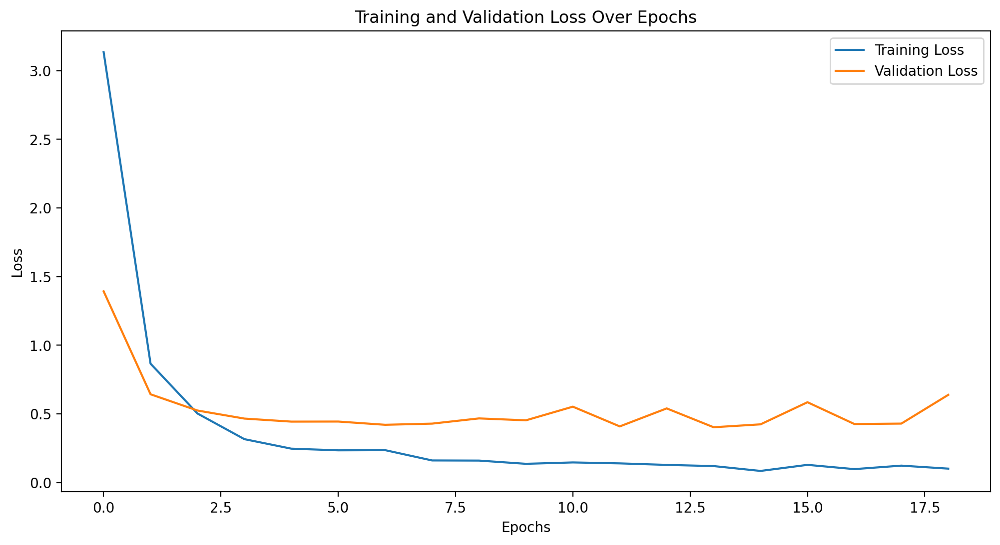

In [21]:
# Create a figure
plt.figure(figsize=(12, 6), dpi=200)

# Plot the training loss
plt.plot(range(len(train_loss_history)), train_loss_history, label='Training Loss')

# Plot the validation loss
plt.plot(range(len(val_loss_history)), val_loss_history, label='Validation Loss')

# Add some helpful labels
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

## Plot the training and validation accuracy

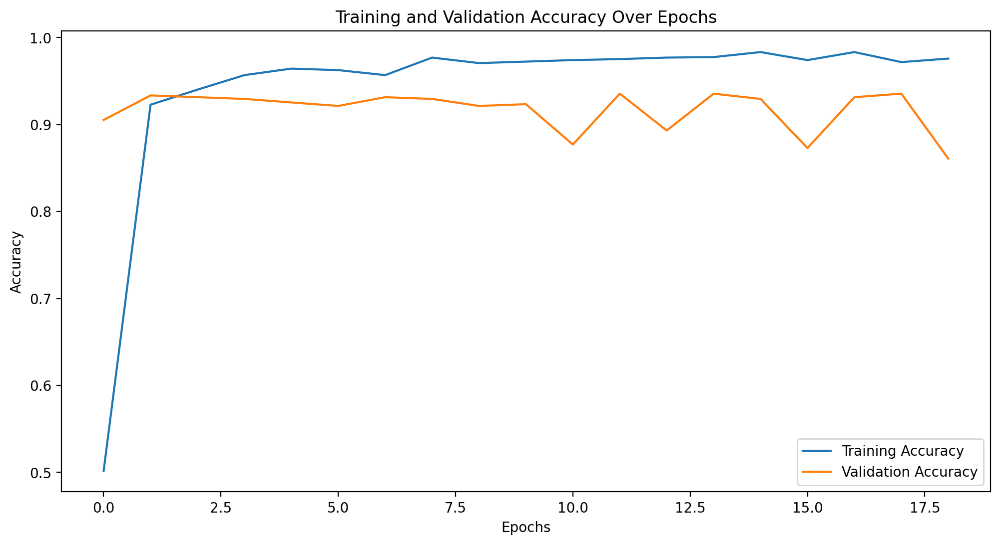

In [22]:
# Create a figure
plt.figure(figsize=(12, 6), dpi=200)

# Plot the training accuracy
plt.plot(range(len(train_acc_history)), train_acc_history, label='Training Accuracy')

# Plot the validation accuracy
plt.plot(range(len(val_acc_history)), val_acc_history, label='Validation Accuracy')

# Add some helpful labels
plt.title('Training and Validation Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Display the plot
plt.show()

## In preparation for the second training, I unfreeze all layers to prepare and train my model for fine tuning

In [23]:
# Unfreeze all layers for fine-tuning
for param in model.parameters():
    param.requires_grad = True

optimizer = optim.Adam(model.parameters(), lr=0.0001)

## Training for the second phase

In [24]:
# Reset the stop count
best_loss = None
stop_count = 0

# Lists to keep track of progress
train_loss_history_tuned = []
train_acc_history_tuned = []
val_loss_history_tuned = []
val_acc_history_tuned = []

# Fine-tuning loop
for epoch in range(num_epochs):
    print('Fine-Tuning Epoch {}/{}'.format(epoch, num_epochs - 1))
    print('-' * 10)

    train_loss, train_acc = train_model(model, train_dataloader, criterion, optimizer)
    print('Train Loss: {:.4f} Acc: {:.4f}'.format(train_loss, train_acc))

    val_loss, val_acc = validate_model(model, valid_dataloader, criterion)
    print('Val Loss: {:.4f} Acc: {:.4f}'.format(val_loss, val_acc))

    # Record the loss and accuracy values
    train_loss_history_tuned.append(train_loss)
    train_acc_history_tuned.append(train_acc)
    val_loss_history_tuned.append(val_loss)
    val_acc_history_tuned.append(val_acc)

    # Checkpointing
    torch.save(model.state_dict(), f'fine_tuned_model_epoch_{epoch}.pth')

    # Early stopping
    if best_loss is None or val_loss < best_loss:
        best_loss = val_loss
        best_model = deepcopy(model.state_dict())
        best_epoch = epoch
        stop_count = 0
    else:
        stop_count += 1

    if stop_count >= patience:
        print("Early stopping fine-tuning...")
        break

Fine-Tuning Epoch 0/24
----------
Train Loss: 0.2472 Acc: 0.9355
Val Loss: 0.5610 Acc: 0.8911
Fine-Tuning Epoch 1/24
----------
Train Loss: 0.0881 Acc: 0.9793
Val Loss: 0.5047 Acc: 0.9153
Fine-Tuning Epoch 2/24
----------
Train Loss: 0.0476 Acc: 0.9902
Val Loss: 0.4844 Acc: 0.9274
Fine-Tuning Epoch 3/24
----------
Train Loss: 0.0327 Acc: 0.9925
Val Loss: 0.4821 Acc: 0.9315
Fine-Tuning Epoch 4/24
----------
Train Loss: 0.0208 Acc: 0.9965
Val Loss: 0.4452 Acc: 0.9335
Fine-Tuning Epoch 5/24
----------
Train Loss: 0.0343 Acc: 0.9937
Val Loss: 0.5188 Acc: 0.9133
Fine-Tuning Epoch 6/24
----------
Train Loss: 0.0179 Acc: 0.9971
Val Loss: 0.4551 Acc: 0.9355
Fine-Tuning Epoch 7/24
----------
Train Loss: 0.0114 Acc: 0.9988
Val Loss: 0.4200 Acc: 0.9456
Fine-Tuning Epoch 8/24
----------
Train Loss: 0.0067 Acc: 0.9994
Val Loss: 0.4079 Acc: 0.9456
Fine-Tuning Epoch 9/24
----------
Train Loss: 0.0039 Acc: 1.0000
Val Loss: 0.4228 Acc: 0.9476
Fine-Tuning Epoch 10/24
----------
Train Loss: 0.0094 Acc: 0

In [25]:
# Load the best model
model.load_state_dict(best_model)
print("Loaded best fine-tuned model from epoch ", best_epoch)

Loaded best fine-tuned model from epoch  10


## Evaluate model on test dataset

In [26]:
test_loss, test_acc = validate_model(model, test_dataloader, criterion)
print('Test Loss: {:.4f} Test Accuracy: {:.4f}'.format(test_loss, test_acc))

Test Loss: 0.1273 Test Accuracy: 0.9718


## Plot the training and validation loss

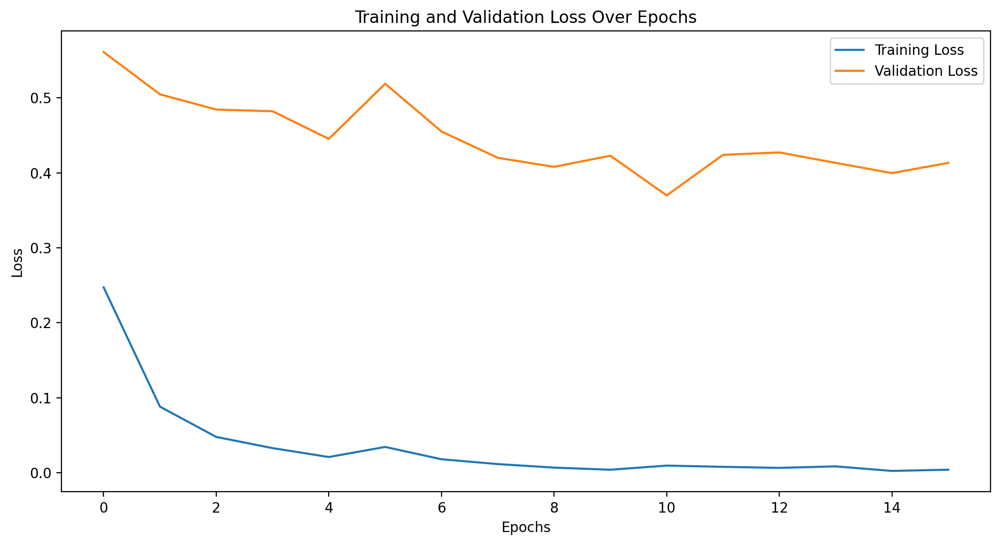

In [27]:
# Create a figure
plt.figure(figsize=(12, 6), dpi=200)

# Plot the training loss
plt.plot(range(len(train_loss_history_tuned)), train_loss_history_tuned, label='Training Loss')

# Plot the validation loss
plt.plot(range(len(val_loss_history_tuned)), val_loss_history_tuned, label='Validation Loss')

# Add some helpful labels
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the plot
plt.show()

## Plot the training and validation accuracy

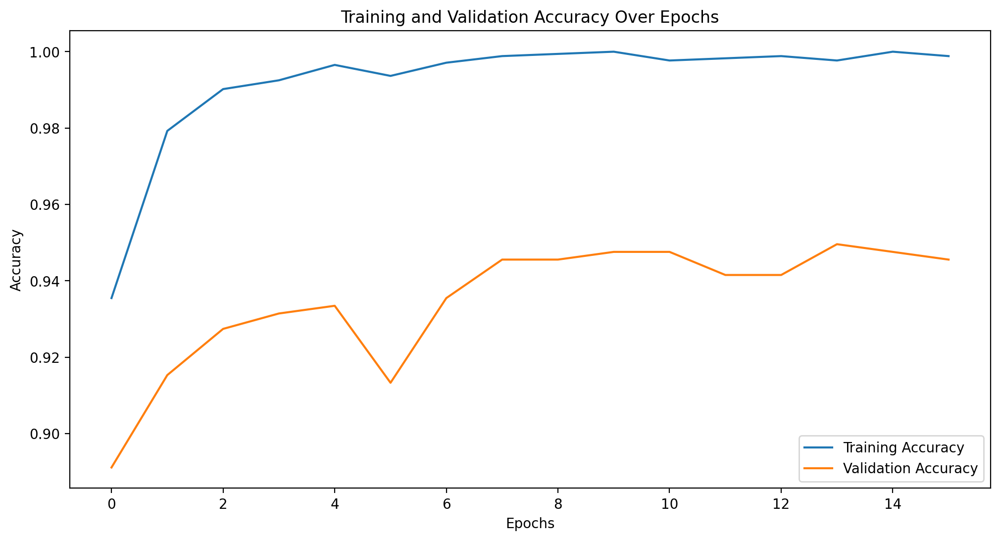

In [28]:
# Create a figure
plt.figure(figsize=(12, 6), dpi=200)

# Plot the training accuracy
plt.plot(range(len(train_acc_history_tuned)), train_acc_history_tuned, label='Training Accuracy')

# Plot the validation accuracy
plt.plot(range(len(val_acc_history_tuned)), val_acc_history_tuned, label='Validation Accuracy')

# Add some helpful labels
plt.title('Training and Validation Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Display the plot
plt.show()

## Save the model to be used in future on a new dataset

In [29]:
# Save the best fine-tuned model
torch.save(model.state_dict(), 'ResNet_Best_Weights.pth')

## Plot some examples from the test set and show the true and predicted labels

In [30]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title, fontsize=12)

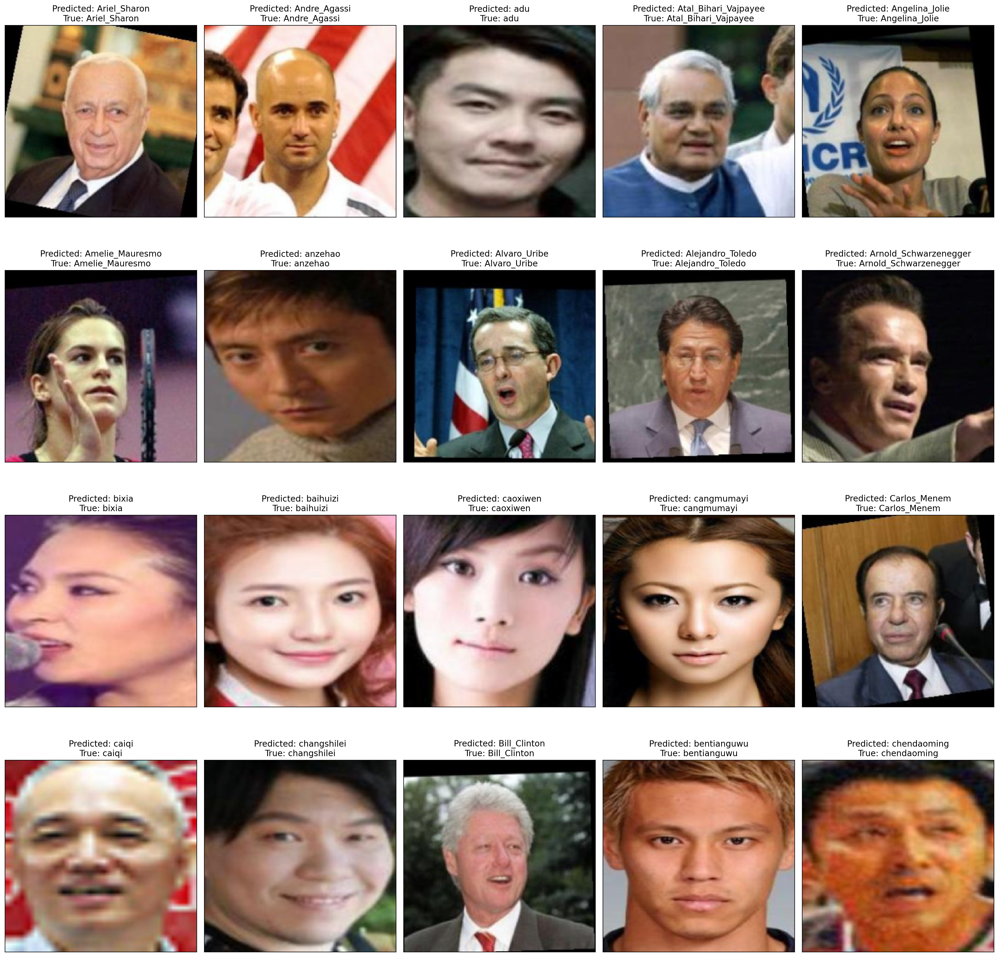

In [31]:
# Move model to the device
model.to(device)

# Number of classes to display
num_classes = 20

# Prepare the figure
fig = plt.figure(figsize=(20, 20), dpi=200)

# Create sets to keep track of displayed classes and images
displayed_classes = set()
images_to_display = []
true_labels_to_display = []
pred_labels_to_display = []

# Iterate through the test dataloader
for images, labels in test_dataloader:
    # Move images and labels to the device
    images = images.to(device)
    labels = labels.to(device)

    # Make predictions
    model.eval()
    with torch.no_grad():
        outputs = model(images)
        _, preds = torch.max(outputs, 1)

    preds = preds.cpu().numpy()
    labels = labels.cpu().numpy()

    # Collect one example from each class
    for img, true_label, pred_label in zip(images, labels, preds):
        if true_label not in displayed_classes and len(displayed_classes) < num_classes:
            displayed_classes.add(true_label)
            images_to_display.append(img.cpu())
            true_labels_to_display.append(true_label)
            pred_labels_to_display.append(pred_label)

    # Break if we have enough examples
    if len(displayed_classes) >= num_classes:
        break

# Convert integer labels to class names
int_to_label = {v: k for k, v in label_to_int.items()}
true_class_names = [int_to_label[c] for c in true_labels_to_display]
pred_class_names = [int_to_label[c] for c in pred_labels_to_display]

# Plot the graph
for i, (img, true_name, pred_name) in enumerate(zip(images_to_display, true_class_names, pred_class_names)):
    ax = fig.add_subplot(4, 5, i + 1, xticks=[], yticks=[]) # Adjust this according to num_classes
    imshow(img, title="Predicted: " + pred_name + "\nTrue: " + true_name)

plt.tight_layout()
plt.show()


## To test the model I have trained with the best weights, I am using 2 identities from the Asian Faces Dataset (AFD) to test out the model

## Define new transformation due to image size difference

In [74]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [75]:
train_dataset = datasets.ImageFolder('/content/drive/MyDrive/test_data/Training', transform=transform)
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)

valid_dataset = datasets.ImageFolder('/content/drive/MyDrive/test_data/Validation', transform=transform)
valid_dataloader = torch.utils.data.DataLoader(valid_dataset, batch_size=32, shuffle=False)

test_dataset = datasets.ImageFolder('/content/drive/MyDrive/test_data/Testing', transform=transform)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=False)

## Load the model with previously trained weights

In [99]:
# Model Loading and Modification
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the model with the updated number of classes
model = InceptionResnetV1(pretrained='vggface2', classify=True, num_classes=129)

In [81]:
num_new_classes = len(train_dataset.classes)

In [56]:
print('Number of classes in new dataset ' + str(num_new_classes))

Number of classes in new dataset 5


In [112]:
# 1. Ensure the model is on the right device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Modify for 129 classes
num_classes = 129
model.logits = nn.Linear(model.logits.in_features, num_classes)

# Load the weights
model_weights_path = 'ResNet_Best_Weights.pth'
model_dict = model.state_dict()
pretrained_dict = {k: v for k, v in torch.load(model_weights_path).items() if k in model_dict and model_dict[k].shape == v.shape}
model_dict.update(pretrained_dict)
model.load_state_dict(model_dict)

<All keys matched successfully>

In [113]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters())

## Train the model on the new dataset

In [114]:
for param in model.parameters():
    param.requires_grad = True

for param in model.logits.parameters():
    param.requires_grad = True

In [120]:
model = model.to(device)
# Training loop with early stopping
num_epochs = 25
patience = 10  # Patience for early stopping
best_loss = None
best_model_wts = None
stop_count = 0

# Lists to keep track of progress
train_loss_history = []
train_acc_history = []
val_loss_history = []
val_acc_history = []

# Training loop
for epoch in range(num_epochs):
    print('Epoch {}/{}'.format(epoch, num_epochs - 1))
    print('-' * 10)

    # Training phase
    train_loss, train_acc = train_model(model, train_dataloader, criterion, optimizer)
    print('Train Loss: {:.4f} Acc: {:.4f}'.format(train_loss, train_acc))

    # Validation phase
    val_loss, val_acc = validate_model(model, valid_dataloader, criterion)
    print('Val Loss: {:.4f} Acc: {:.4f}'.format(val_loss, val_acc))

    # Record the loss and accuracy values
    train_loss_history.append(train_loss)
    train_acc_history.append(train_acc)
    val_loss_history.append(val_loss)
    val_acc_history.append(val_acc)

    # Early stopping based on validation loss
    if best_loss is None or val_loss < best_loss:
        best_loss = val_loss
        best_model_wts = deepcopy(model.state_dict())
        stop_count = 0
    else:
        stop_count += 1

    # If patience is reached, stop training
    if stop_count >= patience:
        print("Early stopping...")
        break

# Load best model weights and save
model.load_state_dict(best_model_wts)
torch.save(model.state_dict(), 'model_best_newdata.pth')

print('Training complete. Best val loss: {:.4f}'.format(best_loss))

Epoch 0/24
----------
Train Loss: 4.4497 Acc: 0.3167
Val Loss: 15.5954 Acc: 0.2000
Epoch 1/24
----------
Train Loss: 1.4250 Acc: 0.9000
Val Loss: 71.3038 Acc: 0.2000
Epoch 2/24
----------
Train Loss: 0.4302 Acc: 0.9667
Val Loss: 18.3154 Acc: 0.3500
Epoch 3/24
----------
Train Loss: 0.1117 Acc: 1.0000
Val Loss: 5.6809 Acc: 0.3500
Epoch 4/24
----------
Train Loss: 0.0489 Acc: 1.0000
Val Loss: 7.6434 Acc: 0.2500
Epoch 5/24
----------
Train Loss: 0.0828 Acc: 1.0000
Val Loss: 6.5564 Acc: 0.3500
Epoch 6/24
----------
Train Loss: 0.0323 Acc: 1.0000
Val Loss: 5.1313 Acc: 0.4000
Epoch 7/24
----------
Train Loss: 0.0325 Acc: 1.0000
Val Loss: 3.9800 Acc: 0.5500
Epoch 8/24
----------
Train Loss: 0.0564 Acc: 1.0000
Val Loss: 3.6646 Acc: 0.4500
Epoch 9/24
----------
Train Loss: 0.1144 Acc: 0.9667
Val Loss: 5.7780 Acc: 0.3000
Epoch 10/24
----------
Train Loss: 0.1020 Acc: 0.9500
Val Loss: 7.5550 Acc: 0.2000
Epoch 11/24
----------
Train Loss: 0.1554 Acc: 0.9667
Val Loss: 4.4983 Acc: 0.4000
Epoch 12/24

In [121]:
for param in model.parameters():
    param.requires_grad = True

optimizer = optim.Adam(model.parameters(), lr=0.0001)

In [122]:
# Training loop with early stopping
num_epochs = 50
patience = 10  # Patience for early stopping
best_loss = None
best_model_wts = None
stop_count = 0

# Lists to keep track of progress
train_loss_history = []
train_acc_history = []
val_loss_history = []
val_acc_history = []

# Training loop
for epoch in range(num_epochs):
    print('Epoch {}/{}'.format(epoch, num_epochs - 1))
    print('-' * 10)

    # Training phase
    train_loss, train_acc = train_model(model, train_dataloader, criterion, optimizer)
    print('Train Loss: {:.4f} Acc: {:.4f}'.format(train_loss, train_acc))

    # Validation phase
    val_loss, val_acc = validate_model(model, valid_dataloader, criterion)
    print('Val Loss: {:.4f} Acc: {:.4f}'.format(val_loss, val_acc))

    # Record the loss and accuracy values
    train_loss_history.append(train_loss)
    train_acc_history.append(train_acc)
    val_loss_history.append(val_loss)
    val_acc_history.append(val_acc)

    # Early stopping based on validation loss
    if best_loss is None or val_loss < best_loss:
        best_loss = val_loss
        best_model_wts = deepcopy(model.state_dict())
        stop_count = 0
    else:
        stop_count += 1

    # If patience is reached, stop training
    if stop_count >= patience:
        print("Early stopping...")
        break

# Load best model weights and save
model.load_state_dict(best_model_wts)
torch.save(model.state_dict(), 'model_best_newdata.pth')

print('Training complete. Best val loss: {:.4f}'.format(best_loss))

Epoch 0/49
----------
Train Loss: 0.0875 Acc: 0.9667
Val Loss: 3.1021 Acc: 0.4000
Epoch 1/49
----------
Train Loss: 0.0252 Acc: 1.0000
Val Loss: 2.6975 Acc: 0.4500
Epoch 2/49
----------
Train Loss: 0.0284 Acc: 1.0000
Val Loss: 2.2850 Acc: 0.6000
Epoch 3/49
----------
Train Loss: 0.0123 Acc: 1.0000
Val Loss: 1.6293 Acc: 0.6000
Epoch 4/49
----------
Train Loss: 0.0247 Acc: 0.9833
Val Loss: 1.2492 Acc: 0.7000
Epoch 5/49
----------
Train Loss: 0.0081 Acc: 1.0000
Val Loss: 0.9242 Acc: 0.7500
Epoch 6/49
----------
Train Loss: 0.0031 Acc: 1.0000
Val Loss: 0.8836 Acc: 0.8000
Epoch 7/49
----------
Train Loss: 0.0033 Acc: 1.0000
Val Loss: 0.8670 Acc: 0.8500
Epoch 8/49
----------
Train Loss: 0.0045 Acc: 1.0000
Val Loss: 1.0313 Acc: 0.8500
Epoch 9/49
----------
Train Loss: 0.0031 Acc: 1.0000
Val Loss: 1.0707 Acc: 0.8000
Epoch 10/49
----------
Train Loss: 0.0051 Acc: 1.0000
Val Loss: 0.9705 Acc: 0.8000
Epoch 11/49
----------
Train Loss: 0.0043 Acc: 1.0000
Val Loss: 1.0168 Acc: 0.8000
Epoch 12/49
--

## Plot the training and validation loss

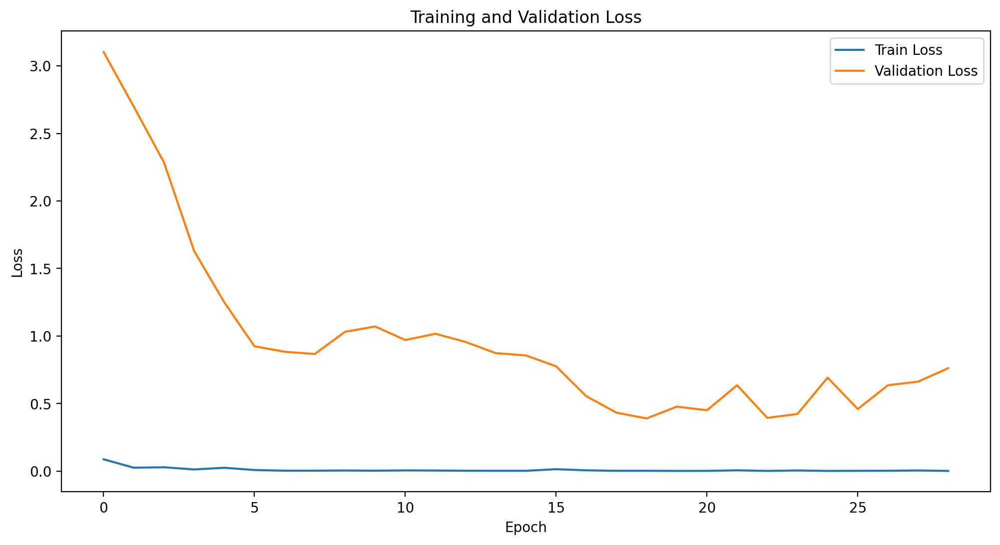

In [130]:
plt.figure(figsize=(12,6),dpi=200)
plt.plot(range(len(train_loss_history)), train_loss_history, label='Train Loss')
plt.plot(range(len(val_loss_history)), val_loss_history, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Plot the training and validation accuracy

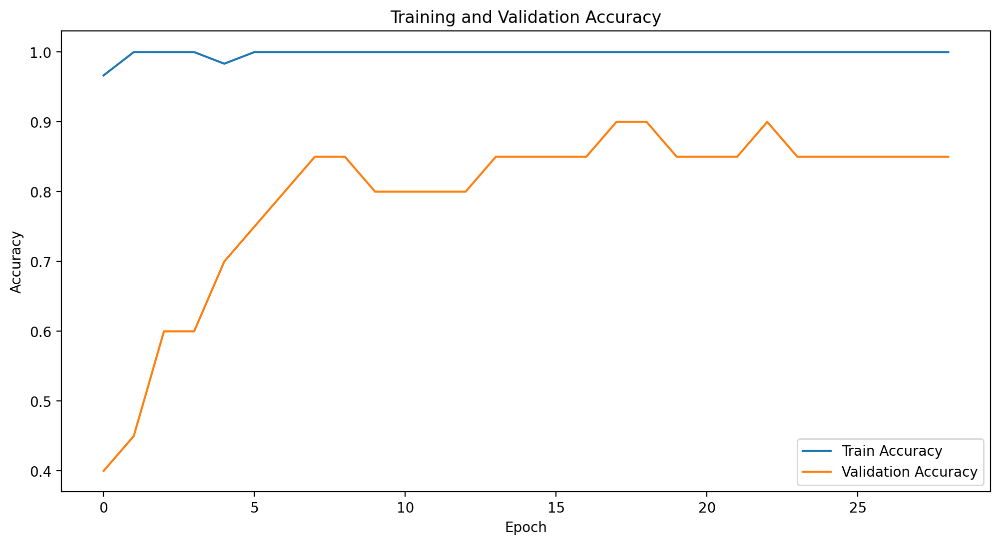

In [132]:
plt.figure(figsize=(12, 6), dpi=200)
plt.plot(range(len(train_acc_history)), train_acc_history, label='Train Accuracy')
plt.plot(range(len(val_acc_history)), val_acc_history, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

## Plot some examples from the validation dataset

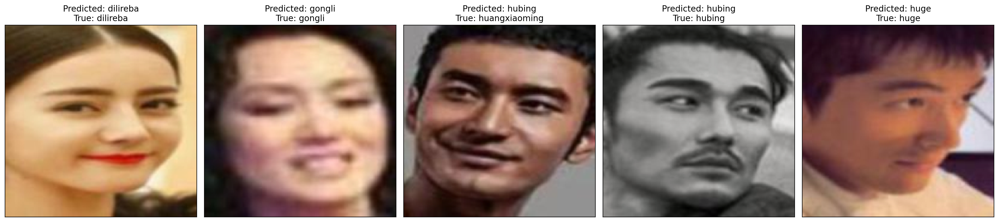

In [123]:
model.to(device)

num_classes = 5
fig = plt.figure(figsize=(20, 20), dpi=200)
displayed_classes = set()
images_to_display = []
true_labels_to_display = []
pred_labels_to_display = []

for images, labels in test_dataloader:
    images = images.to(device)
    labels = labels.to(device)

    model.eval()
    with torch.no_grad():
        outputs = model(images)
        _, preds = torch.max(outputs, 1)

    preds = preds.cpu().numpy()
    labels = labels.cpu().numpy()

    for img, true_label, pred_label in zip(images, labels, preds):
        if true_label not in displayed_classes and len(displayed_classes) < num_classes:
            displayed_classes.add(true_label)
            images_to_display.append(img.cpu())
            true_labels_to_display.append(true_label)
            pred_labels_to_display.append(pred_label)

    if len(displayed_classes) >= num_classes:
        break

int_to_label = {v: k for k, v in test_dataset.class_to_idx.items()}  # Note the change here

true_class_names = [int_to_label[c] for c in true_labels_to_display]
pred_class_names = [int_to_label[c] for c in pred_labels_to_display]

for i, (img, true_name, pred_name) in enumerate(zip(images_to_display, true_class_names, pred_class_names)):
    ax = fig.add_subplot(4, 5, i + 1, xticks=[], yticks=[])
    imshow(img, title="Predicted: " + pred_name + "\nTrue: " + true_name)

plt.tight_layout()
plt.show()